In [1]:
import cv2
import matplotlib.pyplot as plt
import numpy as np
import os
from sklearn.cluster import KMeans
from collections import Counter
from torchvision import models, transforms
from PIL import Image
import seaborn as sns
from utils.ImagesClustering import FastSpriteCluster

# Auxiliar functions

In [4]:
def read_channels(image_type, sprite_file_name, orientation):
    sprite_front = cv2.imread(f'data/processed/{image_type}/{orientation}/{sprite_file_name}', cv2.IMREAD_UNCHANGED)
    b, g, r, a = cv2.split(sprite_front)
    sprite_bgra = cv2.merge((b, g, r, a)) 
    sprite_bgra = cv2.cvtColor(sprite_bgra, cv2.COLOR_BGRA2RGBA)
    return b, g, r, a, sprite_bgra

def plot_channels(image_type, sprite_file_name):
    b_front, g_front, r_front, a_front, sprite_bgra_front = read_channels(image_type, sprite_file_name, 'front')
    b_left, g_left, r_left, a_left, sprite_bgra_left = read_channels(image_type, sprite_file_name, 'left')

    fig, axes = plt.subplots(2, 5, figsize=(30, 10))
    axes[0,0].imshow(sprite_bgra_front)
    axes[0,0].set_title('FRONT')
    axes[0,1].imshow(r_front, cmap='Reds')
    axes[0,1].set_title('R')
    axes[0,2].imshow(g_front, cmap='Greens')
    axes[0,2].set_title('G')
    axes[0,3].imshow(b_front, cmap='Blues')
    axes[0,3].set_title('B')
    axes[0,4].imshow(a_front)
    axes[0,4].set_title('A')

    axes[1,0].imshow(sprite_bgra_left)
    axes[1,0].set_title('LEFT')
    axes[1,1].imshow(r_left, cmap='Reds')
    axes[1,1].set_title('R')
    axes[1,2].imshow(g_left, cmap='Greens')
    axes[1,2].set_title('G')
    axes[1,3].imshow(b_left, cmap='Blues')
    axes[1,3].set_title('B')
    axes[1,4].imshow(a_left)
    axes[1,4].set_title('A')

    

def plot_bulk(image_type, orientation):
    sprites = os.listdir(f'data/processed/{image_type}/{orientation}/')
    fig, axes = plt.subplots(10, 20, figsize=(50, 25))
    row = 0
    col = 0
    for idx, file in enumerate(sprites):
        _, _, _, _, sprite = read_channels(image_type, file.split('/')[-1], orientation)
        if (idx%20==0)&(idx>0):
            row+=1
            col=0
        axes[row,col].imshow(sprite)
        axes[row,col].set_title(file.split('/')[-1])
        axes[row,col].axis("off")
        col+=1

# First toughts

* At least in the 1st run, we will use sprites looking at the front and to the left, all in 64x64 sizes
* We should keep in mind that we have further directions and positions for each sprite if needed
* All the images contain an alpha channel

# Kid bulk plot

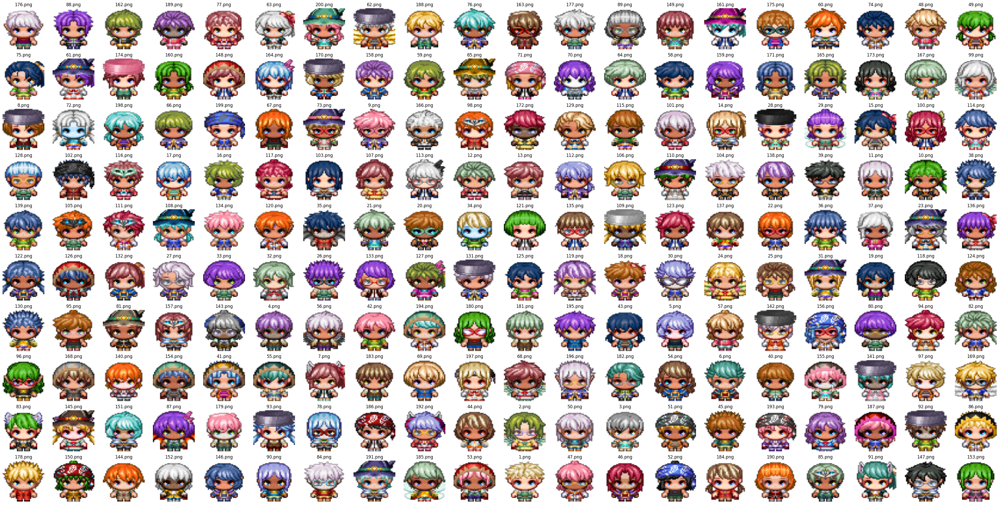

In [5]:
plot_bulk('kid','front')

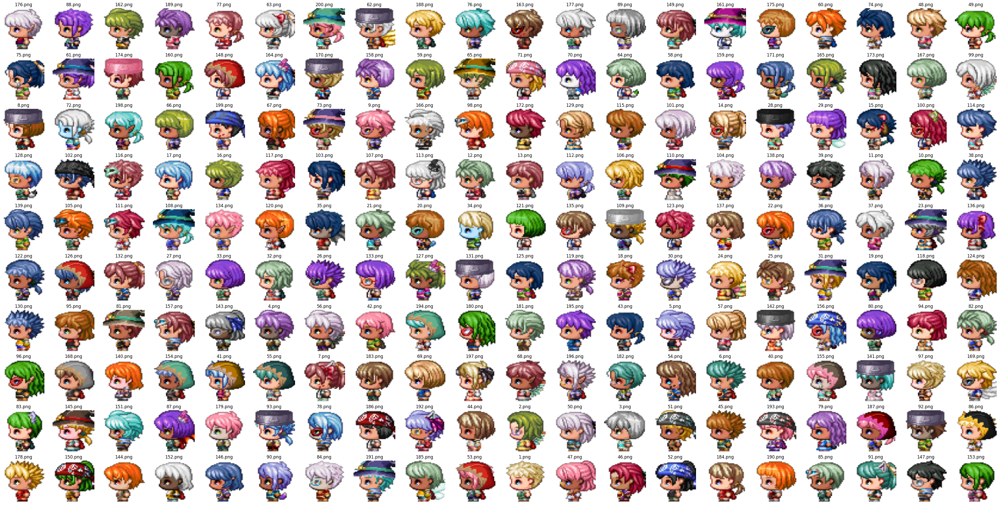

In [6]:
plot_bulk('kid','left')

---

# Clustering

- These sprites are generated randomly by assembling different parts, such as hair, hats, and colors. Given this, a problem arises where two characters that look very similar could end up in the training and test sets, which may introduce data leakage.
- We will perform clustering to see if we can group similar characters together and use entire clusters for training or testing.
- We will use two approaches prior clustering:
    1. Using the features extracted from a VGG16 model
    2. Flattening the images

In [7]:
fsc = FastSpriteCluster()
vgg_l, vgg_a = fsc.vgg_features('kid','left')
s_l, s_a = fsc.flatten_sprites('kid','left')

Loading VGG weights...


/Users/nicolas.dominutti/Desktop/ml/SpriteRotatorGAN/venv/lib/python3.9/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/Users/nicolas.dominutti/Desktop/ml/SpriteRotatorGAN/venv/lib/python3.9/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


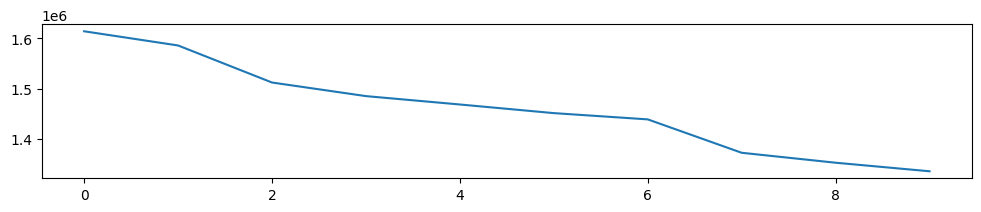

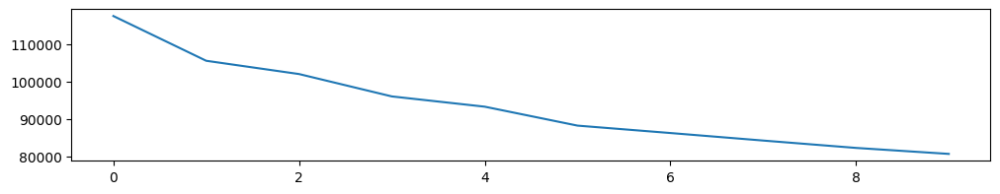

In [8]:
fsc.find_k(vgg_a)
fsc.find_k(s_a)

In [9]:
vgg_labels = fsc.predict_clusters(vgg_a, 7)
s_labels = fsc.predict_clusters(s_a,5)

Counter({np.int32(6): 45, np.int32(4): 43, np.int32(1): 34, np.int32(5): 29, np.int32(3): 27, np.int32(0): 19, np.int32(2): 3})
Counter({np.int32(3): 51, np.int32(2): 50, np.int32(4): 45, np.int32(1): 33, np.int32(0): 21})


When the flatten values are used, the cluster's separation logic seems to be ruled by the sprites color pallette

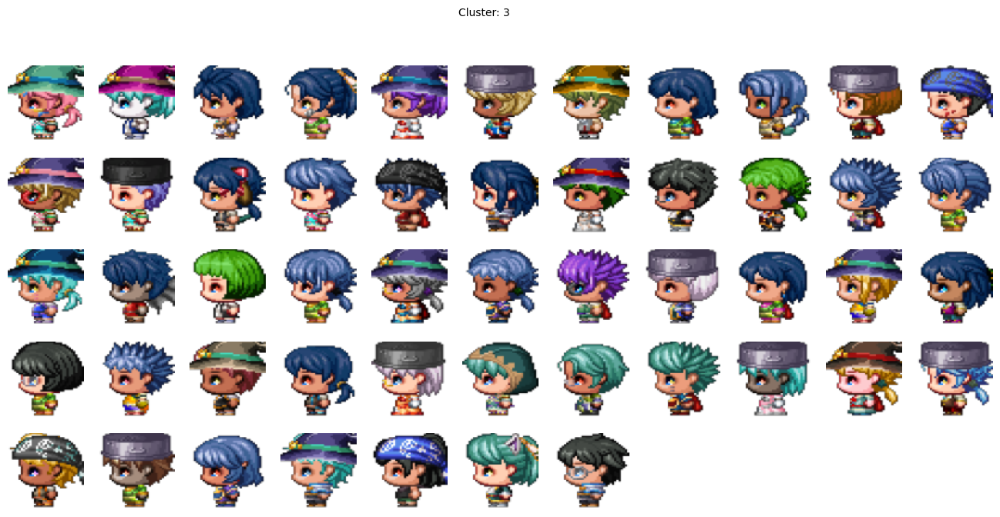

In [10]:

#FLATTENING APPROACH
fsc.plot_clustered_sprites(3, s_labels, s_l)

* We observe that the VGG features lead to more meaningful clusters, where the primary separating factor is not color (as in the flattening approach), but the actual features present in the sprites
* For example, consider the hair of these three sprites: in the first two, the hair is exactly the same, while in the third one, it shares half of the style with the other two and has just a longer tail

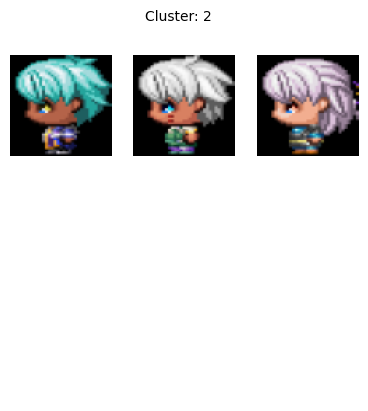

In [11]:
fsc.plot_clustered_sprites(2, vgg_labels, vgg_l)

* Additionally, VGG creates a cluster with almost all the sprites that have some kind of hat or helmet
* For these sprites, we should ensure that certain families of hats, such as the wizard hat, remain in the training set, while another family is kept in the test set

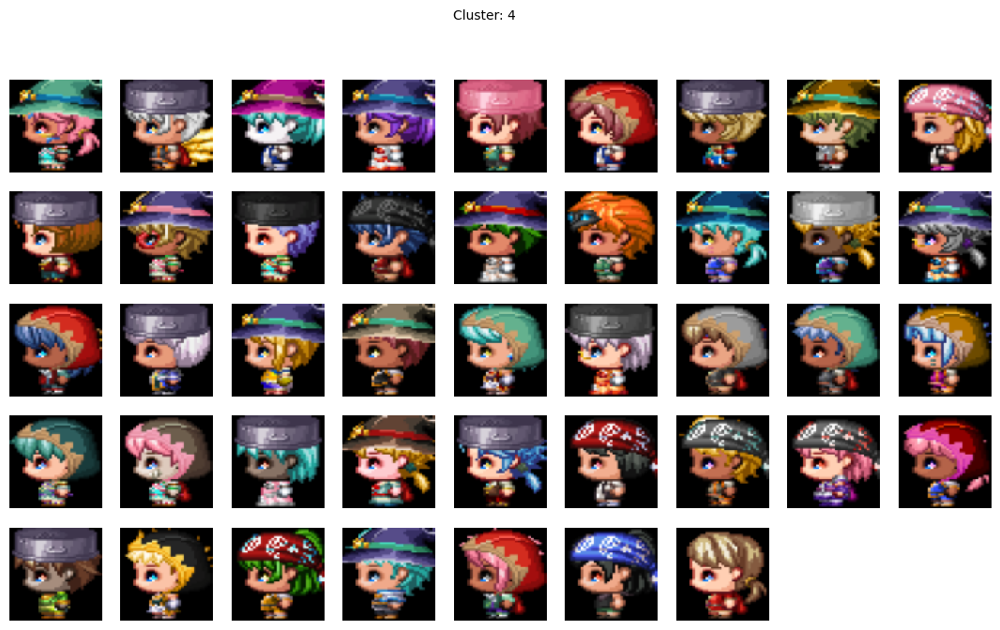

In [12]:
fsc.plot_clustered_sprites(4, vgg_labels, vgg_l)

We will use these VGG features clusters to create our train-test sets at the very end of this notebook, keeping entire clusters inside each partition. The only exception will be with cluster n° 4 -the one that contains the spirtes with helmets/hats- where we will work a little bit more manually 

---

# Channels
* We should remember that each sprite has an alpha channel, we could be able to use it to enhance our performance in some sort of way

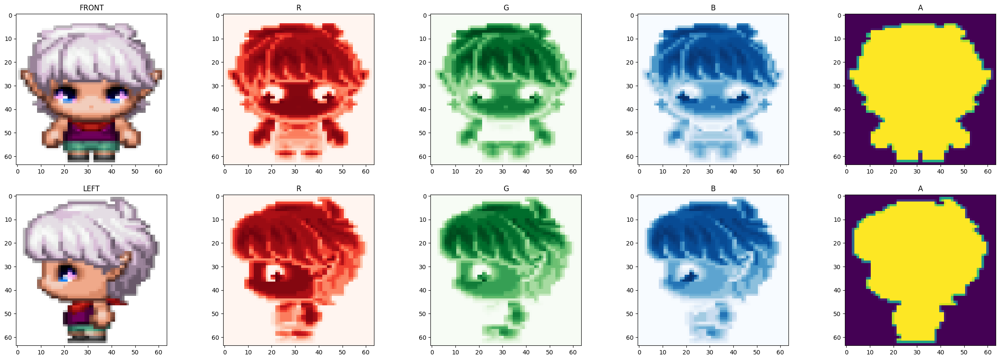

In [349]:
plot_channels('kid','176.png')

Let's take a deep dive into the alpha channel, as it's the one telling us which pixels are being used

In [672]:
alpha_channel_f = []
red_channel_f   = []
green_channel_f = []
blue_channel_f  = []

alpha_channel_l = []
red_channel_l   = []
green_channel_l = []
blue_channel_l  = []

sprites_front = os.listdir(f'data/processed/kid/front/')
sprites_left = os.listdir(f'data/processed/kid/left/')
for file in sprites_front:
    sprite = Image.open(f'data/processed/kid/front/'+file.split('/')[-1])
    b, g, r, a = sprite.split()
    blue_channel_f.append(np.array(b))
    red_channel_f.append(np.array(r))
    green_channel_f.append(np.array(g))
    alpha_channel_f.append(np.array(a))
for file in sprites_left:
    sprite = Image.open(f'data/processed/kid/left/'+file.split('/')[-1])
    b, g, r, a = sprite.split()
    blue_channel_l.append(np.array(b))
    red_channel_l.append(np.array(r))
    green_channel_l.append(np.array(g))
    alpha_channel_l.append(np.array(a))

sprites_front = os.listdir(f'data/processed/male/front/')
sprites_left = os.listdir(f'data/processed/male/left/')
for file in sprites_front:
    sprite = Image.open(f'data/processed/male/front/'+file.split('/')[-1])
    b, g, r, a = sprite.split()
    blue_channel_f.append(np.array(b))
    red_channel_f.append(np.array(r))
    green_channel_f.append(np.array(g))
    alpha_channel_f.append(np.array(a))
for file in sprites_left:
    sprite = Image.open(f'data/processed/male/left/'+file.split('/')[-1])
    b, g, r, a = sprite.split()
    blue_channel_l.append(np.array(b))
    red_channel_l.append(np.array(r))
    green_channel_l.append(np.array(g))
    alpha_channel_l.append(np.array(a))

sprites_front = os.listdir(f'data/processed/female/front/')
sprites_left = os.listdir(f'data/processed/female/left/')
for file in sprites_front:
    sprite = Image.open(f'data/processed/female/front/'+file.split('/')[-1])
    b, g, r, a = sprite.split()
    blue_channel_f.append(np.array(b))
    red_channel_f.append(np.array(r))
    green_channel_f.append(np.array(g))
    alpha_channel_f.append(np.array(a))
for file in sprites_left:
    sprite = Image.open(f'data/processed/female/left/'+file.split('/')[-1])
    b, g, r, a = sprite.split()
    blue_channel_l.append(np.array(b))
    red_channel_l.append(np.array(r))
    green_channel_l.append(np.array(g))
    alpha_channel_l.append(np.array(a))

* We have pixels near the corners that are almost never used for front nor left facing images, maybe giving this information to the GAN -as a mask for example- could be beneficial

Text(0.5, 1.0, 'Left facing')

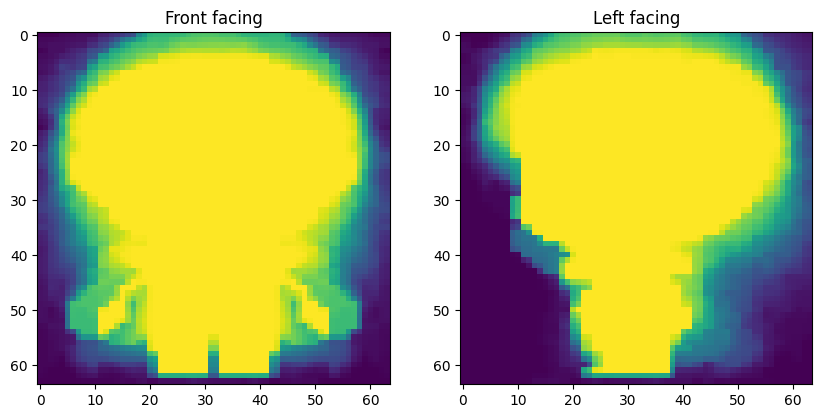

In [603]:
fig, axes = plt.subplots(1,2, figsize=(10,5))
axes[0].imshow(np.mean(alpha_channel_f, axis=0))
axes[0].set_title('Front facing')
axes[1].imshow(np.mean(alpha_channel_l, axis=0))
axes[1].set_title('Left facing')

Let's see the pixel intensity distribution by channel, is there any color that tends to rule the dataset?

In [604]:
for idx in range(len(red_channel_f)):
    mask = alpha_channel_f[idx] > 0
    masked_red = red_channel_f[idx][mask]
    padding_size = 4096 - masked_red.size
    padding = np.full((padding_size,), -100)
    red_channel_f[idx] = np.concatenate([masked_red, padding])

for idx in range(len(blue_channel_f)):
    mask = alpha_channel_f[idx] > 0
    masked_blue = blue_channel_f[idx][mask]
    padding_size = 4096 - masked_blue.size
    padding = np.full((padding_size,), -100)
    blue_channel_f[idx] = np.concatenate([masked_blue, padding])

for idx in range(len(green_channel_f)):
    mask = alpha_channel_f[idx] > 0
    masked_green = green_channel_f[idx][mask]
    padding_size = 4096 - masked_green.size
    padding = np.full((padding_size,), -100)
    green_channel_f[idx] = np.concatenate([masked_green, padding])



for idx in range(len(red_channel_l)):
    mask = alpha_channel_l[idx] > 0
    masked_red = red_channel_l[idx][mask]
    padding_size = 4096 - masked_red.size
    padding = np.full((padding_size,), -100)
    red_channel_l[idx] = np.concatenate([masked_red, padding])

for idx in range(len(blue_channel_l)):
    mask = alpha_channel_l[idx] > 0
    masked_blue = blue_channel_l[idx][mask]
    padding_size = 4096 - masked_blue.size
    padding = np.full((padding_size,), -100)
    blue_channel_l[idx] = np.concatenate([masked_blue, padding])

for idx in range(len(green_channel_l)):
    mask = alpha_channel_l[idx] > 0
    masked_green = green_channel_l[idx][mask]
    padding_size = 4096 - masked_green.size
    padding = np.full((padding_size,), -100)
    green_channel_l[idx] = np.concatenate([masked_green, padding])

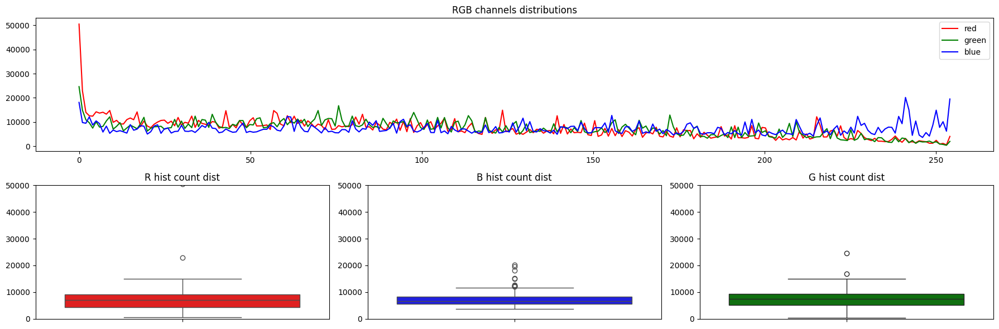

In [520]:
histr, binsr = np.histogram(red_channel_f, bins=256, range=(0, 255))
histg, binsg = np.histogram(green_channel_f, bins=256, range=(0, 255))
histb, binsb = np.histogram(blue_channel_f, bins=256, range=(0, 255))

fig, axes = plt.subplot_mosaic(
    """
    AAAAAA
    BBCCDD
    """,
    figsize=(18,6)
)
axes['A'].plot(binsr[:-1], histr, color='red', label='red')
axes['A'].plot(binsg[:-1], histg, color='green', label='green')
axes['A'].plot(binsb[:-1], histb, color='blue', label='blue')
axes['A'].set_title('RGB channels distributions')
axes['A'].legend()

sns.boxplot(histr, ax=axes['B'], color='red')
axes['B'].set_title('R hist count dist')
axes['B'].set_ylim((0,50000))
sns.boxplot(histb, ax=axes['C'], color='blue')
axes['C'].set_title('B hist count dist')
axes['C'].set_ylim((0,50000))
sns.boxplot(histg, ax=axes['D'], color='green')
axes['D'].set_title('G hist count dist')
axes['D'].set_ylim((0,50000))

plt.tight_layout()

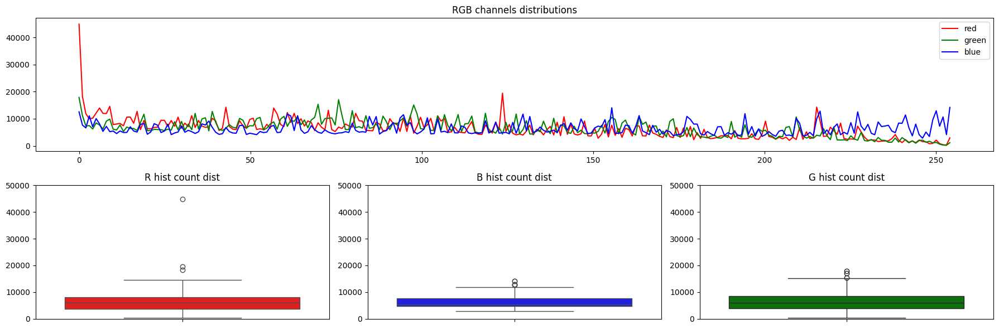

In [521]:
histr, binsr = np.histogram(red_channel_l, bins=256, range=(0, 255))
histg, binsg = np.histogram(green_channel_l, bins=256, range=(0, 255))
histb, binsb = np.histogram(blue_channel_l, bins=256, range=(0, 255))

fig, axes = plt.subplot_mosaic(
    """
    AAAAAA
    BBCCDD
    """,
    figsize=(18,6)
)
axes['A'].plot(binsr[:-1], histr, color='red', label='red')
axes['A'].plot(binsg[:-1], histg, color='green', label='green')
axes['A'].plot(binsb[:-1], histb, color='blue', label='blue')
axes['A'].set_title('RGB channels distributions')
axes['A'].legend()

sns.boxplot(histr, ax=axes['B'], color='red')
axes['B'].set_title('R hist count dist')
axes['B'].set_ylim((0,50000))
sns.boxplot(histb, ax=axes['C'], color='blue')
axes['C'].set_title('B hist count dist')
axes['C'].set_ylim((0,50000))
sns.boxplot(histg, ax=axes['D'], color='green')
axes['D'].set_title('G hist count dist')
axes['D'].set_ylim((0,50000))

plt.tight_layout()

* Have in mind the previous plot is considering only the pixels inside the Alpha channel mask, so for example, blue and green do not have much pixels around 0 value inside the mask and red seems to have many of those values
* We could say that the most prevalent color is BLUE (check the right tail on the 1st plot, and the low bottom whisker in the boxplot)

---

# Pixel importance distribution

In [1156]:
alpha_channel_f_reshape = np.stack(alpha_channel_f).reshape(600,-1)
alpha_channel_l_reshape = np.stack(alpha_channel_l).reshape(600,-1)

In [1157]:
pixel_usage_f = np.sum(alpha_channel_f_reshape>0, axis=0)

always_present_f = np.where(pixel_usage_f>=550)[0]
key_f            = np.where((pixel_usage_f<550) & (pixel_usage_f>=400))[0]
important_f      = np.where((pixel_usage_f<400) & (pixel_usage_f>=200))[0]
relevant_f       = np.where((pixel_usage_f<200) & (pixel_usage_f>=100))[0]
present_f        = np.where((pixel_usage_f<100) & (pixel_usage_f>=50))[0]
outliers_f       = np.where((pixel_usage_f<50) & (pixel_usage_f>0))[0]
never_there_f    = np.where((pixel_usage_f==0))[0]


pixel_usage_l = np.sum(alpha_channel_l_reshape>0, axis=0)

always_present_l = np.where(pixel_usage_l>=550)[0]
key_l            = np.where((pixel_usage_l<550) & (pixel_usage_l>=400))[0]
important_l      = np.where((pixel_usage_l<400) & (pixel_usage_l>=200))[0]
relevant_l       = np.where((pixel_usage_l<200) & (pixel_usage_l>=100))[0]
present_l        = np.where((pixel_usage_l<100) & (pixel_usage_l>=50))[0]
outliers_l       = np.where((pixel_usage_l<50) & (pixel_usage_l>0))[0]
never_there_l    = np.where((pixel_usage_l==0))[0]

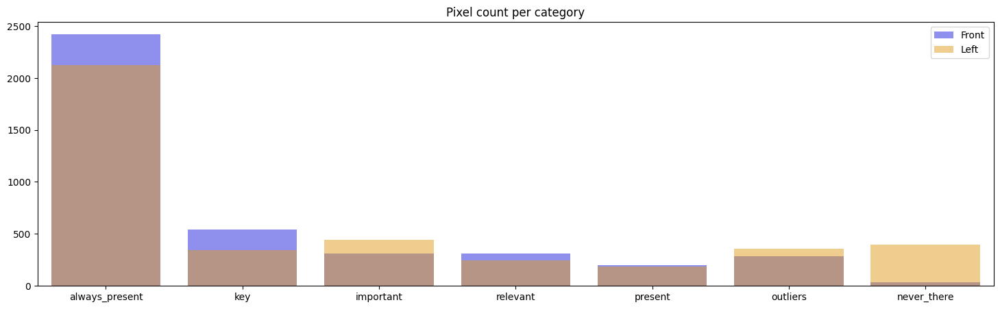

In [1162]:
categories_shape = [always_present_f.shape[0], 
 key_f.shape[0],
 important_f.shape[0],
 relevant_f.shape[0],
 present_f.shape[0],
 outliers_f.shape[0],
 never_there_f.shape[0]
]
plt.figure(figsize=(18,5))
sns.barplot(categories_shape,
    color='blue',
    alpha=.5,
    label='Front')
plt.xticks(
    ticks=range(7),
    labels=['always_present','key','important','relevant','present','outliers','never_there']
)
# plt.title('Pixel count per category | Facing FRONT')


categories_shape = [always_present_l.shape[0], 
 key_l.shape[0],
 important_l.shape[0],
 relevant_l.shape[0],
 present_l.shape[0],
 outliers_l.shape[0],
 never_there_l.shape[0]
]
# plt.figure(figsize=(18,5))
sns.barplot(categories_shape,
    color='orange',
    alpha=.5,
    label='Left')
plt.xticks(
    ticks=range(7),
    labels=['always_present','key','important','relevant','present','outliers','never_there']
)
plt.legend()
plt.title('Pixel count per category');

We see that in our target images (Left), there are more pixels that are never used

---

# Correlation analysis

How does the rest of the pixels behave when we turn on/off an specific other one?

In [ ]:
correlation_matrix = np.zeros((4096, 4096))
for i in range(4096):
    for j in range(4096):
        correlation_matrix[i, j] = np.corrcoef(alpha_channel_f_reshape[:, i], alpha_channel_l_reshape[:, j])[0, 1]

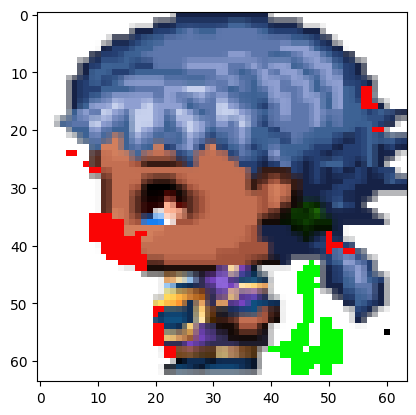

In [1155]:
import copy
use_sprite = True
orientation = 'left'
sprite_id = 100
#sprite 342 have values in pixel
pixel_id = 3580

if use_sprite:
    if orientation=='front':
        example_img = cv2.merge((blue_channel_f[sprite_id], green_channel_f[sprite_id], red_channel_f[sprite_id], alpha_channel_f[sprite_id])) 
    else:
        example_img = cv2.merge((blue_channel_l[sprite_id], green_channel_l[sprite_id], red_channel_l[sprite_id], alpha_channel_l[sprite_id])) 
else:
    example_img = np.zeros((64,64,4))

pixel_vector = correlation_matrix[pixel_id, :]
non_nan_mask = np.isfinite(pixel_vector) 
original_indices = np.where(non_nan_mask)[0]
filtered_pixel_vector = pixel_vector[non_nan_mask]
sorted_indices = np.argsort(filtered_pixel_vector)
sorted_original_indices = original_indices[sorted_indices] 
top_pos_indices = sorted_original_indices[-100:][::-1]
top_neg_indices = sorted_original_indices[:100]


sample_img = copy.deepcopy(example_img.reshape(-1, 4))


for i in top_pos_indices:
    sample_img[i, :] = [0, 250, 0, 250]
for i in top_neg_indices:
    sample_img[i, :] = [250, 0, 0, 250]

sample_img[pixel_id, :] = [0, 0, 0, 255]

plt.imshow(sample_img.reshape(64,64,4))

In the previos image, we see that when the black pixel is ON, it correlates in a positive direction with the green pixels, while in a negative direction with the red ones

---

# Outliers

Given the previos correlation analysis, it was detected that the sprite 342 is clearly an outlier given it's big helmet

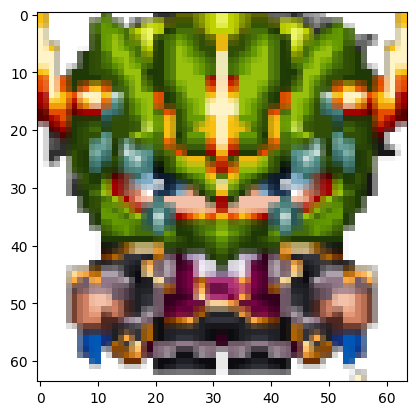

In [1066]:
sprite_id = 342
plt.imshow(cv2.merge((blue_channel_f[sprite_id], green_channel_f[sprite_id], red_channel_f[sprite_id], alpha_channel_f[sprite_id])) )

---

# Train-Test split

In [1]:
import cv2
import matplotlib.pyplot as plt
import numpy as np
import os
from sklearn.cluster import KMeans
from collections import Counter
from torchvision import models, transforms
from PIL import Image
import seaborn as sns
from utils.ImagesClustering import FastSpriteCluster

In [2]:
fsc = FastSpriteCluster()

Loading VGG weights...


/Users/nicolas.dominutti/Desktop/ml/SpriteRotatorGAN/venv/lib/python3.9/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/Users/nicolas.dominutti/Desktop/ml/SpriteRotatorGAN/venv/lib/python3.9/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Processing kid images
Processing female images
Processing male images


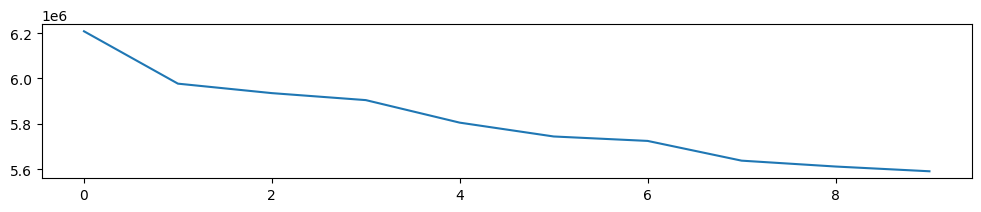

Selected clusters: 7
Counter({np.int32(1): 259, np.int32(2): 188, np.int32(4): 117, np.int32(0): 12, np.int32(5): 11, np.int32(3): 9, np.int32(6): 4})


In [3]:
fsc.cluster(['kid','female','male'],'front')

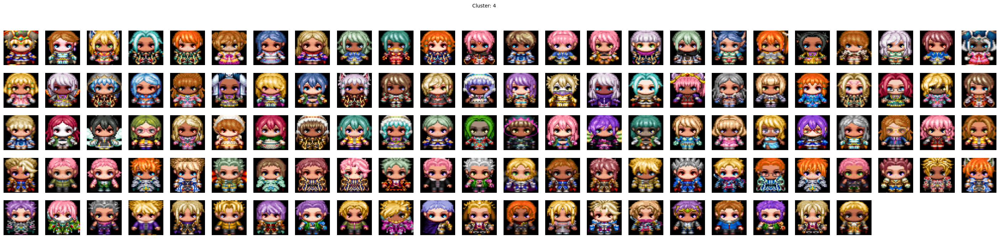

In [4]:
fsc.plot_clustered_sprites(4)

### Selection 
We will use cluster number 4 complete as test (117 sprites) + 2 images from cluster 5 with a pan as a helmet + 1 image with armor from cluster 3

In [29]:
images_array = np.array([(x[0],x[1]) for x in fsc.sprite_images_list])

In [24]:
np.random.seed(42)

def cherrypick_images(labels:np.array, target_label:int, n:int):
    indices = np.where(fsc.labels==target_label)[0]
    return np.random.choice(indices, n)

In [25]:
cluster_3_idx = cherrypick_images(fsc.labels, 3, 1)
cluster_4_idx = np.where(fsc.labels==4)[0]
cluster_5_idx = cherrypick_images(fsc.labels, 5, 2)

In [32]:
test_images = np.concatenate([
    images_array[cluster_3_idx],
    images_array[cluster_4_idx],
    images_array[cluster_5_idx]
])

In [42]:
from collections import defaultdict
test_images_dict = defaultdict(list)
for img in test_images:
    test_images_dict[str(img[0])].append(str(img[1]))

In [47]:
import json
with open('./test_images.json', 'w') as f:
    json.dump(test_images_dict, f)